In [1]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [1]:
from tqdm.autonotebook import tqdm
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import pathlib
import seaborn as sns

from scipy.stats import linregress
from sklearn.model_selection import KFold
import statsmodels.formula.api as smf
import skgstat as skg

import holoviews as hv
import hvplot.pandas        # Necessary for calling .hvplot on a geodatafame

/tmp/ipykernel_4114463/2531037963.py:1: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [2]:
# dir_string = 'GEDIL4A_JRC'
dir_string = 'GEDI4A_JRC_filtering'
dir = pathlib.Path('/maps/forecol/data/Overlays') / dir_string

### 0. Run overlay analysis and combine into single dataframe

```
$ nohup python /home/forecol/biomass-recovery/scripts/run_gedi_jrc_l4a_overlay.py -o <OUT_DIR> -s <SHAPEFILE.zip> &
```


In [ ]:
files = dir.glob('*.feather')
dfs = []
for file in tqdm(files):
    dfs.append(pd.read_feather(file))

df = pd.concat(dfs, ignore_index=True)
df.to_feather(dir / 'dfs_all.feather')

### 1. Read in data

In [3]:
df = pd.read_feather( dir / 'dfs_all.feather')

### 2. Basic data filtering

In [4]:
l4a_data = df
l4a_data['agcd'] = l4a_data.agbd * 0.48
quality_gedi = l4a_data[
    (l4a_data.overlap_quality > 1) & 
    (l4a_data.overlap_quality != 3) &
    (l4a_data.recovery_period >= 3) & 
    (l4a_data.recovery_period <= 22) & 
    (l4a_data.l4_quality_flag == 1) & 
    (l4a_data.l2_quality_flag == 1) &
    (l4a_data.degrade_flag == 0) #&
    #(l4a_data.agbd_pi_lower != -9999)
] 
print(len(quality_gedi))

96348


### 3a. Modeling: Quantile Regression

In [5]:
mod = smf.quantreg("agcd ~ recovery_period", quality_gedi)

In [6]:
quantiles = np.arange(0.05, 0.96, 0.01)
def fit_model(q):
    res = mod.fit(q=q)
    return [
        q, 
        res.params["Intercept"],
        *res.conf_int().loc["Intercept"],
        res.params["recovery_period"],
        *res.conf_int().loc["recovery_period"],
        res.prsquared,
    ]


models = [fit_model(x) for x in quantiles]
models = pd.DataFrame(models, columns=["q", "a", "la", "ua", "b", "lb", "ub", "prs"])
print(models)

print(mod.fit(q=0.5).summary())
median = fit_model(0.5)
median = dict(
    q=median[0],
    a=median[1],
    la=median[2],
    ua=median[3],
    b=median[4],
    lb=median[5],
    ub=median[6],
    prs = median[7]
)



       q          a         la         ua         b        lb        ub  \
0   0.05  -0.000015  -0.026596   0.026565  0.000004 -0.002647  0.002655   
1   0.06  -0.002105  -0.028887   0.024677  0.000527 -0.002218  0.003271   
2   0.07  -0.010700  -0.038408   0.017007  0.002822 -0.000080  0.005724   
3   0.08  -0.021005  -0.050120   0.008111  0.007001  0.003949  0.010053   
4   0.09  -0.042809  -0.072953  -0.012666  0.014270  0.011071  0.017468   
..   ...        ...        ...        ...       ...       ...       ...   
86  0.91  40.075283  39.131229  41.019336  1.651865  1.549270  1.754460   
87  0.92  43.549842  42.530985  44.568698  1.612362  1.501650  1.723074   
88  0.93  47.480536  46.307589  48.653483  1.562023  1.434428  1.689618   
89  0.94  51.832519  50.648519  53.016520  1.521081  1.392200  1.649961   
90  0.95  57.056245  55.740412  58.372078  1.448732  1.305142  1.592322   

             prs  
0  -4.415327e-08  
1   3.873430e-06  
2   4.303732e-05  
3   1.642096e-04  
4   

### 3b. Modeling: Linear Regression

In [9]:
lin_agbd = linregress(quality_gedi.recovery_period, quality_gedi.agbd)
lin_agcd = linregress(quality_gedi.recovery_period, quality_gedi.agcd)
ols = smf.ols("agcd ~ recovery_period", quality_gedi).fit()
ols_ci = ols.conf_int().loc["recovery_period"].tolist()
ols_intercept_ci = ols.conf_int().loc["Intercept"].tolist()
ols = dict(
    a=ols.params["Intercept"], 
    la=ols_intercept_ci[0], 
    ua=ols_intercept_ci[1],
    b=ols.params["recovery_period"], 
    lb=ols_ci[0], 
    ub=ols_ci[1]
)

### 4. Graphs

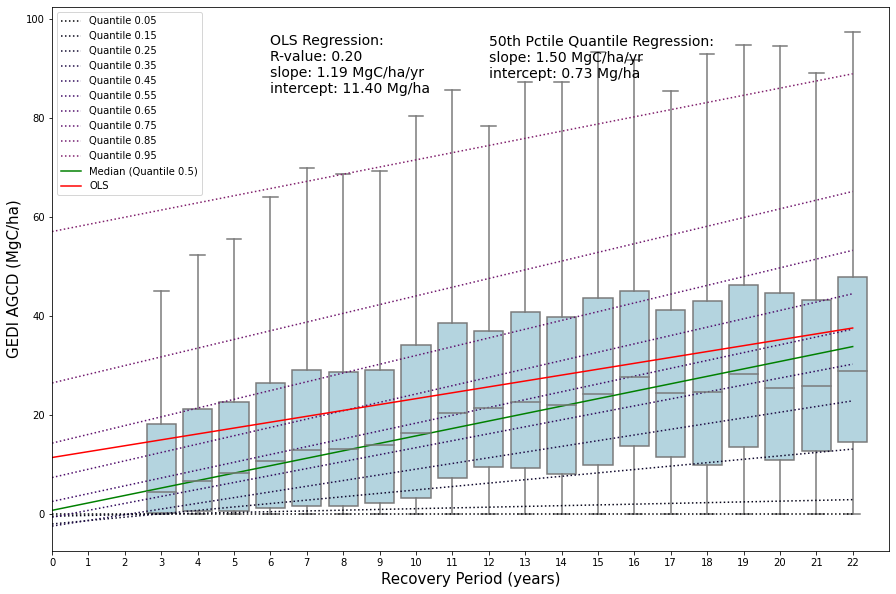

In [12]:
plt.figure(1, (15,10))
ax = sns.boxplot(x="recovery_period", y="agcd", data=quality_gedi, color='lightblue', showfliers=False, order=np.arange(23))
ax.set_ylabel("GEDI AGCD (MgC/ha)", fontsize=15)
ax.set_xlabel("Recovery Period (years)", fontsize=15)
ax.set_xlim([0,23])
xs = np.arange(0, 23)

cmap = plt.get_cmap('inferno')
get_ys = lambda a, b: a + b * xs
for i in range(0,models.shape[0], 10):
    ys = get_ys(models.a[i], models.b[i])
    ax.plot(xs, ys, linestyle="dotted", color=cmap(i), label='Quantile {0:.2f}'.format(models.q[i]))


med_ys = get_ys(median['a'], median['b'])
ax.plot(xs, med_ys, color='green', label='Median (Quantile 0.5)')

ax.plot(xs, lin_agcd.intercept + lin_agcd.slope * xs, 'r', label='OLS')
text_label = (
    "OLS Regression:\n"
    "R-value: {0:.2f}\n"
    "slope: {1:.2f} MgC/ha/yr\n"
    "intercept: {2:.2f} Mg/ha").format(
        lin_agcd.rvalue, lin_agcd.slope, lin_agcd.intercept)
ax.text(x=6, y=85, s=text_label, fontsize=14)

text_label_2 = (
    "50th Pctile Quantile Regression:\n"
    "slope: {0:.2f} MgC/ha/yr\n"
    "intercept: {1:.2f} Mg/ha").format(
        median['b'], median['a'])
ax.text(x=12, y=88, s=text_label_2, fontsize=14)
ax.legend(facecolor='white')
# ax.set_ylim([-10, 250])

41    1.426747
Name: b, dtype: float64


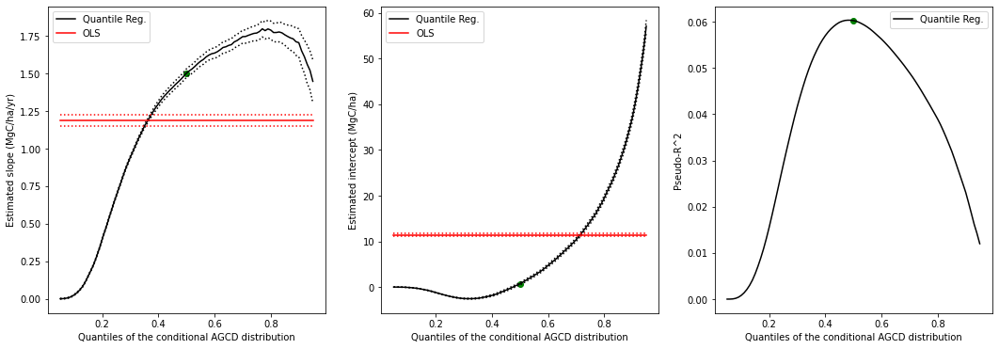

In [13]:
n = models.shape[0]

fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(18, 6))
w = 0.46
print((models[abs(models.q - w) < 0.001]).b)

axs[0].plot(models.q, models.b, color="black", label="Quantile Reg.")
axs[0].plot(models.q, models.ub, linestyle="dotted", color="black")
axs[0].plot(models.q, models.lb, linestyle="dotted", color="black")
# axs[0].scatter(w, (models[abs(models.q - w) < 0.001]).b, color='purple')
axs[0].scatter(0.5, median['b'], color='green')
axs[0].plot(models.q, [ols["b"]] * n, color="red", label="OLS")
axs[0].plot(models.q, [ols["lb"]] * n, linestyle="dotted", color="red")
axs[0].plot(models.q, [ols["ub"]] * n, linestyle="dotted", color="red")
axs[0].set_ylabel(f"Estimated slope (MgC/ha/yr)")
axs[0].set_xlabel("Quantiles of the conditional AGCD distribution")
axs[0].legend(facecolor='white')

axs[1].plot(models.q, models.a, color="black", label="Quantile Reg.")
axs[1].plot(models.q, models.ua, linestyle="dotted", color="black")
axs[1].plot(models.q, models.la, linestyle="dotted", color="black")
# axs[1].scatter(w, (models[abs(models.q - w) < 0.001]).a, color='purple')
axs[1].scatter(0.5, median['a'], color='green')
axs[1].plot(models.q, [ols["a"]] * n, color="red", label="OLS")
axs[1].plot(models.q, [ols["la"]] * n, linestyle="dotted", color="red")
axs[1].plot(models.q, [ols["ua"]] * n, linestyle="dotted", color="red")
axs[1].set_ylabel(f"Estimated intercept (MgC/ha)")
axs[1].set_xlabel("Quantiles of the conditional AGCD distribution")
axs[1].legend(facecolor='white')

axs[2].plot(models.q, models.prs, color="black", label="Quantile Reg.")
# axs[2].scatter(w, (models[abs(models.q - w) < 0.001]).prs, color='purple')
axs[2].scatter(0.5, median['prs'], color='green')
axs[2].set_ylabel(f"Pseudo-R^2")
axs[2].set_xlabel("Quantiles of the conditional AGCD distribution")
axs[2].legend(facecolor='white')
plt.show()

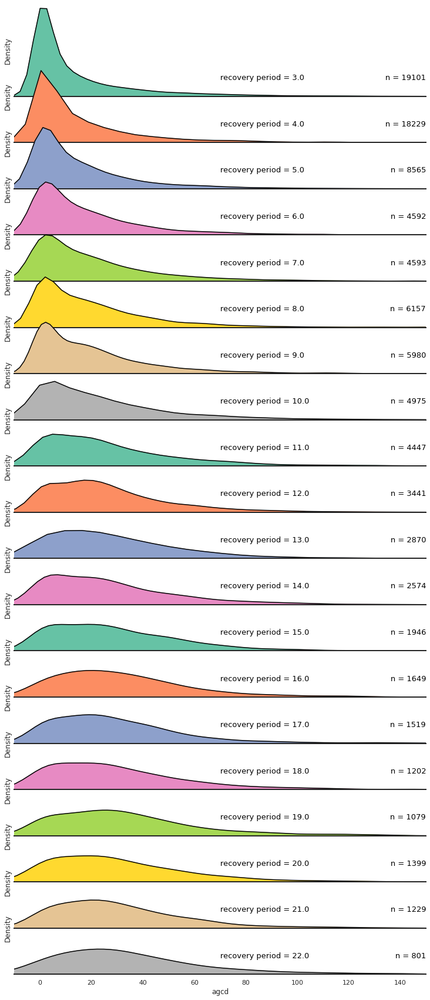

In [14]:
sns.set_theme(style="white", rc={"axes.facecolor": (0, 0, 0, 0), 'axes.linewidth':2})
palette = sns.color_palette("Set2", 12)
g = sns.FacetGrid(quality_gedi, palette=palette, row="recovery_period", hue="recovery_period", aspect=9, height=1.2, xlim=[-10,150])
g.map_dataframe(sns.kdeplot, x="agcd", fill=True, alpha=1)
g.map_dataframe(sns.kdeplot, x="agcd", color='black')


def label(x, color, label):
    ax = plt.gca()
    ax.text(0.5, .2, f'recovery period = {label}', color='black', fontsize=13,
            ha="left", va="center", transform=ax.transAxes)
    ax.text(1, .2, f'n = {len(x)}', color='black', fontsize=13,
            ha='right', va='center', transform=ax.transAxes)
    
g.map(label, "recovery_period")
g.fig.subplots_adjust(hspace=-.5)
g.set_titles("")
g.set(yticks=[], xlabel="agcd")
g.despine( left=True)
#g.refline(x=0, linestyle='dashed', ylim=[0,0.06])

#plt.suptitle('Netflix Originals - IMDB Scores by Language', y=0.98)

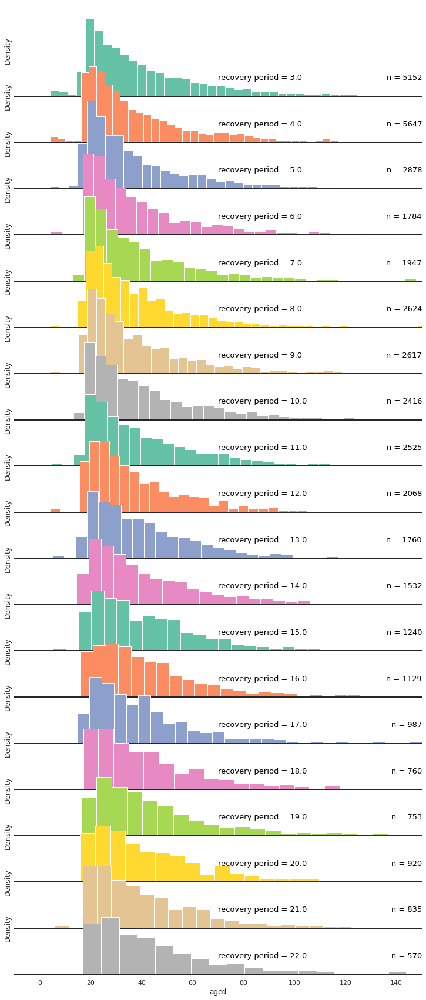

In [7]:
sns.set_theme(style="white", rc={"axes.facecolor": (0, 0, 0, 0), 'axes.linewidth':2})
palette = sns.color_palette("Set2", 12)
g = sns.FacetGrid(quality_gedi, palette=palette, row="recovery_period", hue="recovery_period", aspect=9, height=1.2, xlim=[-10,150])
g.map_dataframe(sns.histplot, x="agcd", fill=True, alpha=1, stat='density')
#g.map_dataframe(sns.kdeplot, x="agcd", color='black')


def label(x, color, label):
    ax = plt.gca()
    ax.text(0.5, .2, f'recovery period = {label}', color='black', fontsize=13,
            ha="left", va="center", transform=ax.transAxes)
    ax.text(1, .2, f'n = {len(x)}', color='black', fontsize=13,
            ha='right', va='center', transform=ax.transAxes)
    
g.map(label, "recovery_period")
g.fig.subplots_adjust(hspace=-.5)
g.set_titles("")
g.set(yticks=[], xlabel="agcd")
g.despine( left=True)

### 5. Cross-validation

In [11]:
# K-fold cross-validation for the median quantile regression line
# Returns array of error results on each split.

def check_function(q, ys, predictions):
    abs_err = (ys - predictions).abs()
    penalty_under = (q * abs_err[predictions <= ys]).sum()
    penalty_over = ((1 - q) * abs_err[predictions > ys]).sum()
    return (penalty_under + penalty_over) / len(ys)

def compute_qreg_error(model, data, predictor, response):
    a = model.params['Intercept']
    b = model.params[predictor]
    predictions = a + b * data[predictor]
    return check_function(0.5, data[response], predictions) 


def cross_validate_median_regression(
    n_splits: int, data: pd.DataFrame, predictor: str, response: str):
    kf = KFold(n_splits=n_splits, shuffle=True)
    qregs = []
    for train_index, test_index in kf.split(data):
        train = data.iloc[train_index].loc[:, [predictor, response]]
        test =  data.iloc[test_index][[predictor, response]]

        mod = smf.quantreg(response + ' ~ ' + predictor, train)
        median_model = mod.fit(q=0.5)

        qregs.append(compute_qreg_error(median_model, test, predictor, response))

    return np.array(qregs)

In [17]:
qregs = cross_validate_median_regression(
    n_splits=10,
    data=quality_gedi,
    predictor='recovery_period',
    response='agcd'
)
print(qregs)
print(qregs.mean())


[8.12972373 8.36086331 8.16984341 8.27265058 8.34953535 8.21815438
 8.40656737 8.07162206 8.03747145 8.14543166]
8.216186331220491


In [7]:
# Add column of residuals to dataframe
q=0.5
mod = smf.quantreg('agcd ~ recovery_period', quality_gedi)
median_model = mod.fit(q=q)

predictions = median_model.params['Intercept'] + median_model.params['recovery_period'] * quality_gedi['recovery_period']
quality_gedi['median_error'] = predictions - quality_gedi['agcd']

abs_err = quality_gedi.median_error.abs()
quality_gedi['median_qreg_error'] = np.zeros_like(abs_err)
quality_gedi.loc[quality_gedi.median_error <= 0, 'median_qreg_error']  = q * abs_err[quality_gedi.median_error <= 0]
quality_gedi.loc[quality_gedi.median_error > 0, 'median_qreg_error'] = (1 - q) * abs_err[quality_gedi.median_error > 0]

/tmp/ipykernel_1357226/383683554.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  quality_gedi['median_error'] = predictions - quality_gedi['agcd']
/tmp/ipykernel_1357226/383683554.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  quality_gedi['median_qreg_error'] = np.zeros_like(abs_err)
/home/forecol/bin/miniconda3/envs/biomass/lib/python3.9/site-packages/pandas/core/indexing.py:1773: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_index

count    9.634800e+04
mean    -8.245183e+00
std      2.856587e+01
min     -1.281676e+03
25%     -1.567212e+01
50%     -9.939261e-07
75%      6.622826e+00
max      3.381453e+01
Name: median_error, dtype: float64
count    96348.000000
mean         8.215980
std         12.389316
min          0.000001
25%          2.500680
50%          4.408315
75%          9.414916
max        640.837917
Name: median_qreg_error, dtype: float64


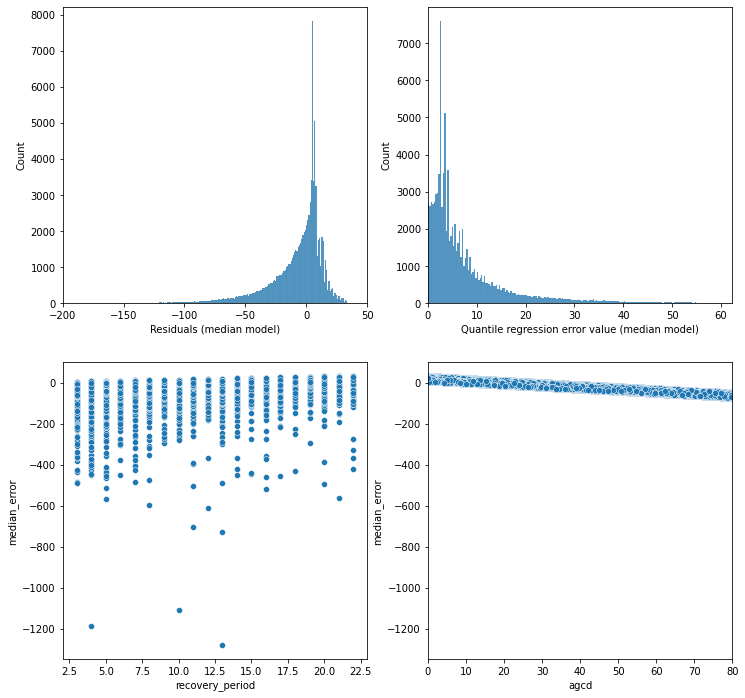

In [15]:
# Plot model residuals (histogram)
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(12, 12))
sns.histplot(quality_gedi, x='median_error', ax=axs[0, 0])
axs[0, 0].set_xlim(-200, 50)
axs[0, 0].set_xlabel('Residuals (median model)')
sns.histplot(quality_gedi, x='median_qreg_error', ax=axs[0, 1])
axs[0, 1].set_xlim(0, 8.2 + 12.3 * 4.4)
axs[0, 1].set_xlabel('Quantile regression error value (median model)')
sns.scatterplot(data=quality_gedi, x='recovery_period', y='median_error', ax=axs[1,0])
sns.scatterplot(data=quality_gedi, x='agcd', y='median_error', ax=axs[1,1])
axs[1,1].set_xlim(0,80)
print(quality_gedi.median_error.describe())
print(quality_gedi.median_qreg_error.describe())


### 6. Spatial (Auto)correlation

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
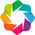

/home/forecol/bin/miniconda3/envs/biomass/lib/python3.9/site-packages/geoviews/operation/projection.py:79: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  polys = [g for g in geom if g.area > 1e-15]


:DynamicMap   []
   :Overlay
      .Tiles.I    :Tiles   [x,y]
      .Polygons.I :Polygons   [Longitude,Latitude]
      .Image.I    :Image   [Longitude,Latitude]   (Longitude_Latitude median_error)

In [22]:

quality_gedi_gdf = gpd.GeoDataFrame(quality_gedi, geometry=gpd.points_from_xy(quality_gedi.lon_lowestmode, quality_gedi.lat_lowestmode))


In [ ]:
# Spatial visualization of model residuals 
hv.extension('bokeh')
geometry = gpd.read_file(pathlib.Path('/home/forecol/amelia/Amazon_rainforest_shapefile.zip'))

geom_plot = geometry.hvplot(geo=True, tiles='EsriImagery', alpha=0.0)
gedi_plot = quality_gedi_gdf[quality_gedi_gdf.median_error.abs() < 80].hvplot.points(c='median_error', geo=True, rasterize=True, colorbar=True, frame_height=450, cmap='seismic')
geom_plot * gedi_plot

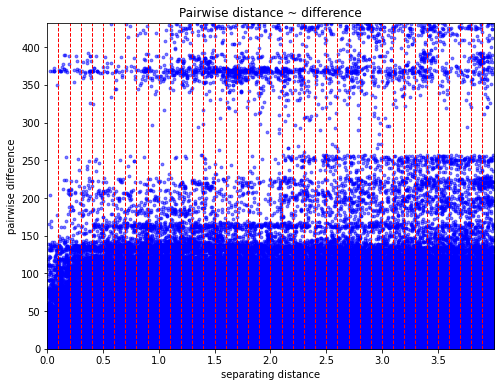

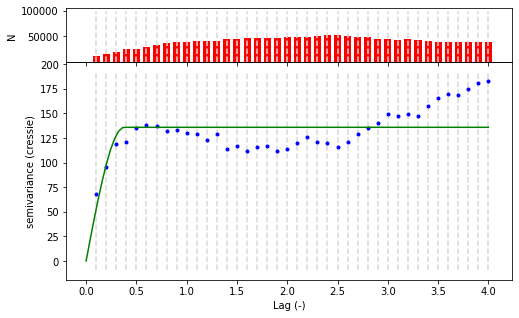

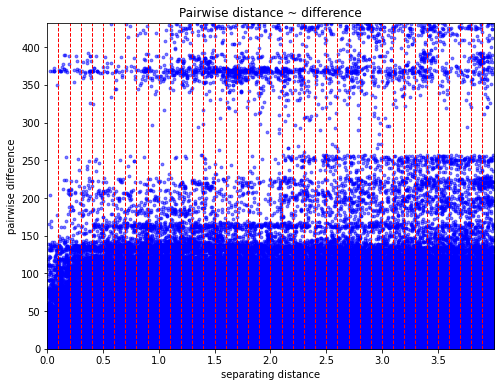

In [9]:
# Plot variogram based on residuals

# Sample a random selection of data points
k = 20      # Randomly sample 1/k th of the points
np.random.seed(42)
idxs = np.random.randint(0, len(quality_gedi), (int(len(quality_gedi) / k)))
coords = quality_gedi.iloc[idxs][['lon_lowestmode', 'lat_lowestmode']].to_numpy()
values = quality_gedi.iloc[idxs]['median_error'].abs().to_numpy()
V = skg.Variogram(
    coords,         # Spatial coordinates
    values,         # Residuals
    maxlag=40,       # Maximum distance (in lon,lat units) between data points to consider
    n_lags=40,
)
V.estimator = 'cressie'
V.plot()
V.distance_difference_plot()

### Other ...

In [18]:
tot = len(l4a_data)
lst = []
lst.append(len(l4a_data[l4a_data.overlap_quality != 0]))
lst.append(len(l4a_data[(l4a_data.recovery_period >= 3) & (l4a_data.recovery_period <= 22)]))
lst.append(len(l4a_data[l4a_data.l4_quality_flag == 1]))
lst.append(len(l4a_data[l4a_data.l2_quality_flag == 1]))
lst.append(len(l4a_data[l4a_data.degrade_flag == 0]))

for el in lst:
    print(f"{el}: {el/tot * 100}%")

print(tot)
a = len(quality_gedi[quality_gedi.agbd < 99])
print(f"{a}: {a/len(quality_gedi) * 100}%")


626313: 28.48826128783554%
1794028: 81.60255083591275%
1630945: 74.18461265547568%
1987172: 90.38783349518647%
1672236: 76.06276111612716%
2198495
84805: 88.01947108398721%


801
28
(-0.001, 1.0]     61
(1.0, 2.0]         6
(2.0, 3.0]        11
(3.0, 4.0]         9
(4.0, 5.0]         3
(5.0, 400.0]     710
Name: agcd, dtype: int64


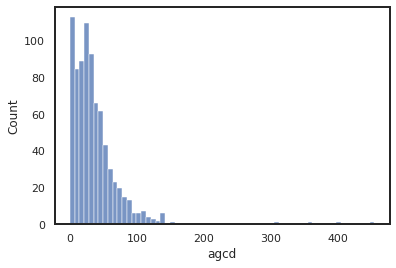

In [19]:
sns.histplot(quality_gedi[quality_gedi.recovery_period == 22], x='agcd')

yr_22 = quality_gedi[quality_gedi.recovery_period == 22]

print(len(yr_22))
print(len(yr_22[yr_22.agcd == 0]))
bins = [0,1,2,3,4,5,400]
print(yr_22['agcd'].value_counts(bins=bins, sort=False))